# Detection - YOLOv5 model

GitHub Repo: https://github.com/ultralytics/yolov5

In [1]:
!git clone https://github.com/ultralytics/yolov5 
%cd yolov5
%pip install -qr requirements.txt 

import pandas as pd
import numpy as np
import glob
from PIL import Image
import re
import matplotlib.pyplot as plt
import torch
from yolov5 import utils

display = utils.notebook_init()  

YOLOv5 🚀 v6.1-227-ga6e99e4 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.7/78.2 GB disk)


## Data Preparation to trening model

When you use YOLO model, you might create annotation labels and yaml file.

To annotation labels you might use makesense ai https://www.makesense.ai/

The 'yaml' file should content path to data, number of class and class names. 

The train data should separate to images and labels data. Each folder should content train data and val data.

In [3]:
!unzip -q ../train_data.zip -d ../

## Training model YOLOv5s
To train model we selected YOLOv5s model. It is the smallest and fastest model available. 
Train a YOLOv5s model on chess data by specifying dataset, batch size, image size, and either pretrained weights. All trainig results are saved to folder run/train.

In [4]:
# Train YOLOv5s on COCO128 for 500 epochs
!python train.py --img 640 --batch 16 --epochs 500 --data chess.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=chess.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=500, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-227-ga6e99e4 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0

## Loading models
Once your model is trained, yours results were saved the best weight in best.pt

In [5]:
model_v5s = torch.hub.load('ultralytics/yolov5', 'custom', path='runs/train/exp/weights/best.pt') 

Downloading: "https://github.com/ultralytics/yolov5/archive/master.zip" to /root/.cache/torch/hub/master.zip
requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...

requirements: 1 package updated per /content/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 v6.1-227-ga6e99e4 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7045186 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


### Function to numerical sort data

In [6]:
numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

### Validation data

In [10]:
val_img = []
for img in sorted(glob.glob("train_data/images/val/*.jpg"), key=numericalSort):
    n= Image.open(img)
    i= np.asarray(n)
    val_img.append(i)

## Models prediction

In [12]:
predict_v5s = model_v5s(val_img)

In [13]:
predict_v5s.print()

image 1/58: 416x416 1 white-rook
image 2/58: 416x416 1 black-king, 1 black-pawn, 1 black-queen, 1 black-rook, 1 white-bishop, 1 white-king, 2 white-pawns
image 3/58: 416x416 1 white-king
image 4/58: 416x416 1 black-knight
image 5/58: 416x416 2 black-bishops, 1 black-king, 2 black-pawns, 1 white-bishop, 1 white-king, 1 white-pawn
image 6/58: 416x416 1 black-king, 1 black-knight, 3 black-pawns, 1 black-queen, 1 black-rook, 1 white-king, 1 white-knight, 4 white-pawns, 1 white-queen, 2 white-rooks
image 7/58: 416x416 1 black-king, 1 black-knight, 4 black-pawns, 1 black-queen, 1 black-rook, 1 white-king, 1 white-knight, 4 white-pawns, 1 white-queen, 2 white-rooks
image 8/58: 416x416 1 black-king, 1 black-pawn, 1 black-queen, 1 black-rook, 1 white-king, 2 white-pawns
image 9/58: 416x416 1 black-knight
image 10/58: 416x416 2 black-bishops, 1 black-king, 2 black-knights, 5 black-pawns, 2 black-rooks, 2 white-bishops, 1 white-king, 1 white-knight, 4 white-pawns, 1 white-queen, 1 white-rook
imag

### Labels of validation dataset

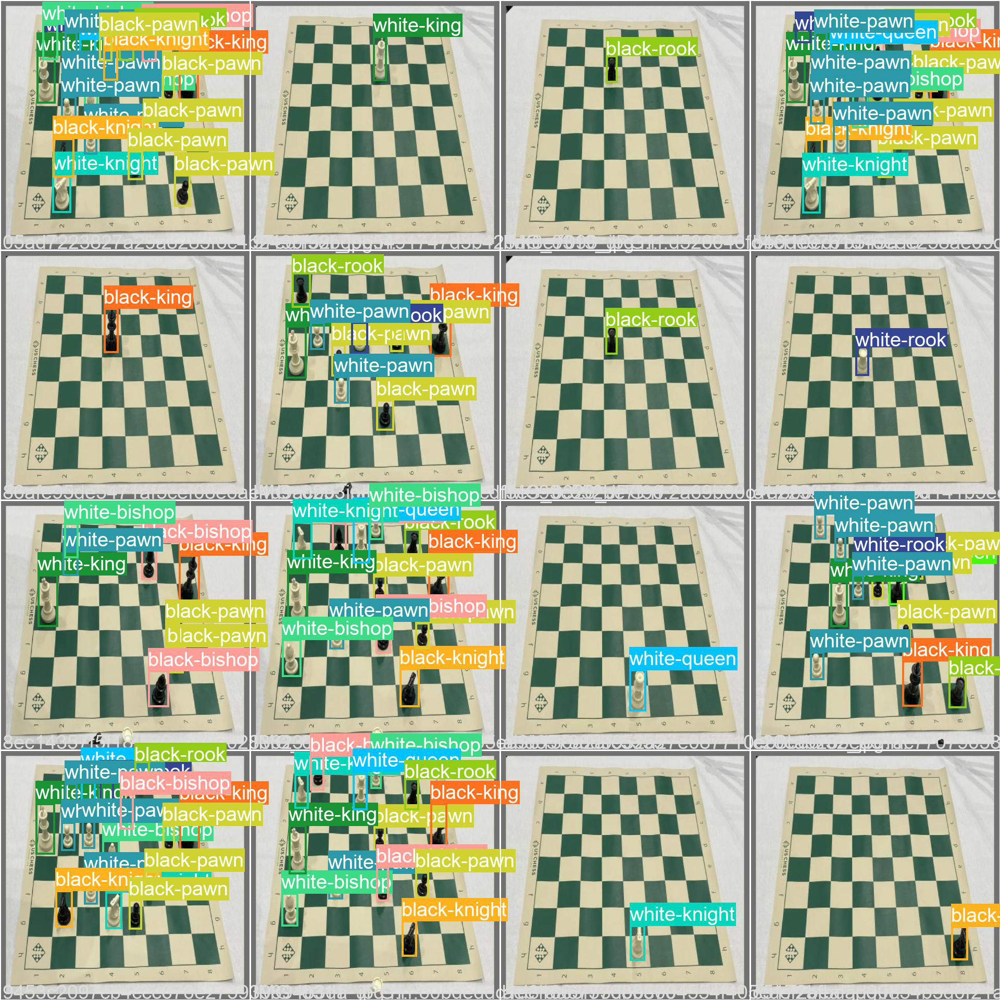

In [14]:
Image.open('results/val_batch0_labels.jpg')

### Prediction for validation dataset

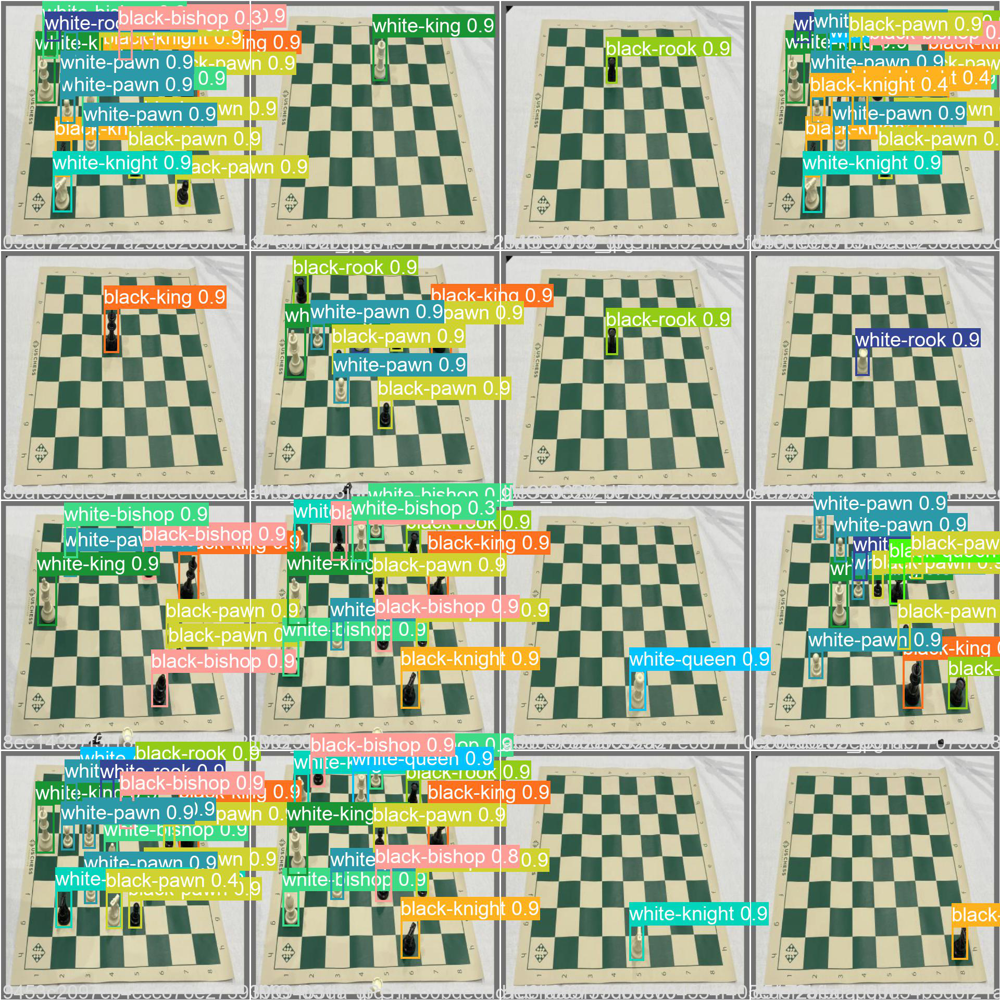

In [16]:
Image.open('results/val_batch0_pred.jpg')